In [2]:
library(readxl)
library(dplyr)
library(tidyr)
library(fpp2)
library(tseries)
library(data.table)
library(Amelia)
library(forecast)
library(TSstudio)
library(urca)
library(tidyverse)
library(lmtest)
library(ggplot2)
library(reprex)
library(GGally)
library(seasonal)


Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

-- Attaching packages ---------------------------------------------- fpp2 2.4 --

v ggplot2   3.3.2     v fma       2.4  
v forecast  8.13      v expsmooth 2.3  




Attaching package: 'data.table'


The following objects are masked from 'package:dplyr':

    between, first, last


Loading required package: Rcpp

## 
## Amelia II: Multiple Imputation
## (Version 1.7.6, built: 2019-11-24)
## Copyright (C) 2005-2021 James Honaker, Gary King and Matthew Blackwell
## Refer to http://gking.harvard.edu/amelia/ for more information
## 

-- Attaching packages --------------------------------------- tidyverse 1.3.0 --

v tibble  3.0.4     v stringr 1.4.0
v readr   1.4.0     v forcats 0.5.0
v purrr   

In [4]:
# install.packages('reprex')
# install.packages('GGally')
# install.packages('devtools')
install.packages('seasonal')

Warning message:
"package 'seasonal' is in use and will not be installed"


In [5]:
heating <- read.csv('C:/Users/Jaswinder Singh/Downloads/Statistics/Data/Time Series/Heating.csv', header = FALSE)

In [6]:
head(heating)

,V1,V2
,<chr>,<chr>
1,TIME,Value
2,2001M01,422.75
3,2001M02,365.77
4,2001M03,384.82
5,2001M04,303.95
6,2001M05,184.88


In [7]:
heating <- heating[-c(1),]
head(heating)

,V1,V2
,<chr>,<chr>
2,2001M01,422.75
3,2001M02,365.77
4,2001M03,384.82
5,2001M04,303.95
6,2001M05,184.88
7,2001M06,129.43


In [8]:
# rownames(heating) <- NULL
# head(heating)

In [9]:
colnames(heating) <- c("Time", "HDD_Index")
head(heating)

,Time,HDD_Index
,<chr>,<chr>
2,2001M01,422.75
3,2001M02,365.77
4,2001M03,384.82
5,2001M04,303.95
6,2001M05,184.88
7,2001M06,129.43


In [10]:
write.csv(heating, "Heating_cleaned.csv")

In [11]:
heating_ts <- ts(as.numeric(heating[,-1]), start=c(2001,1), end=c(2019,12), frequency=12)

In [12]:
heating_ts

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
2001,422.75,365.77,384.82,303.95,184.88,129.43,61.43,63.20,125.25,145.16,288.31,405.17
2002,325.38,306.75,316.88,271.77,205.62,128.85,91.19,43.89,128.21,240.68,264.32,350.96
2003,384.05,348.97,318.31,247.21,193.66,81.82,19.32,38.90,100.64,264.40,278.13,369.45
2004,379.55,360.39,342.66,264.78,205.35,68.25,81.95,31.66,87.48,257.08,288.06,345.75
2005,334.73,356.06,304.54,278.67,225.00,71.15,53.88,39.93,88.00,163.22,336.41,364.78
2006,374.39,355.74,371.13,289.87,199.98,71.68,18.00,53.81,47.10,171.99,299.63,342.63
2007,341.24,321.45,344.13,204.59,197.61,113.51,81.03,72.97,112.66,188.27,273.16,350.89
2008,339.43,335.61,360.31,296.91,154.44,127.20,55.88,32.53,146.13,262.48,321.89,409.04
2009,415.65,354.98,328.71,267.85,196.19,95.97,57.01,45.22,134.01,191.45,306.08,434.61
2010,490.19,425.42,379.47,286.84,230.64,77.18,25.30,84.20,98.73,226.64,373.95,545.74


Warning message:
"Ignoring unknown parameters: ts.colour, ts.linetype"


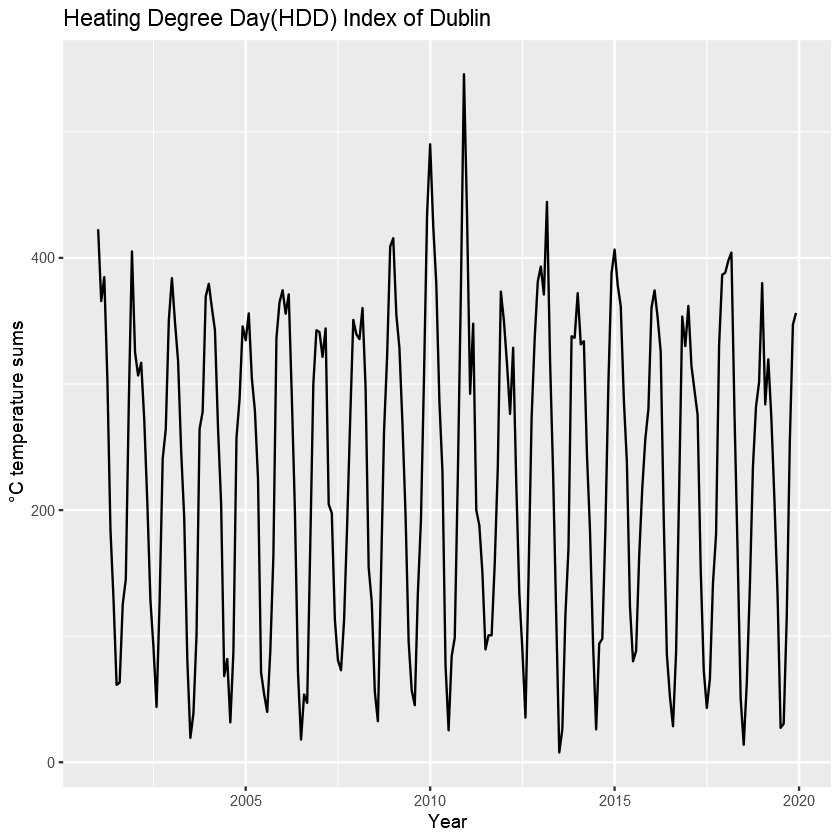

In [40]:
autoplot(heating_ts, ts.colour = 'red', ts.linetype = 'dashed') + ggtitle("Heating Degree Day(HDD) Index of Dublin") +
  xlab("Year") +
  ylab("˚C temperature sums")
# plot(heating_ts)

In [39]:
jpeg("TS_plot_og.jpg", width = 350, height = 350)
# 2. Create the plot
autoplot(heating_ts, ts.colour = 'red', ts.linetype = 'dashed') + ggtitle("Heating Degree Day(HDD) Index of Dublin") +
  xlab("Year") +
  ylab("˚C temperature sums")
# 3. Close the file
dev.off()

Warning message:
"Ignoring unknown parameters: ts.colour, ts.linetype"


png 
  2

### Stationarity Test

In [16]:
adf.test(heating_ts, alternative = 'stationary', k = 2)

Warning message in adf.test(heating_ts, alternative = "stationary", k = 2):
"p-value smaller than printed p-value"



	Augmented Dickey-Fuller Test

data:  heating_ts
Dickey-Fuller = -13.538, Lag order = 2, p-value = 0.01
alternative hypothesis: stationary


So our series is stationary. Hence no need to difference it.

### Decomposition

In [110]:
Heating_add <- ts_decompose(heating_ts, type = "additive", showline = TRUE)
Heating_add
h_add = decompose(heating_ts, type = "additive")
h_add

HTML widgets cannot be represented in plain text (need html)

$x
        Jan    Feb    Mar    Apr    May    Jun    Jul    Aug    Sep    Oct
2001 422.75 365.77 384.82 303.95 184.88 129.43  61.43  63.20 125.25 145.16
2002 325.38 306.75 316.88 271.77 205.62 128.85  91.19  43.89 128.21 240.68
2003 384.05 348.97 318.31 247.21 193.66  81.82  19.32  38.90 100.64 264.40
2004 379.55 360.39 342.66 264.78 205.35  68.25  81.95  31.66  87.48 257.08
2005 334.73 356.06 304.54 278.67 225.00  71.15  53.88  39.93  88.00 163.22
2006 374.39 355.74 371.13 289.87 199.98  71.68  18.00  53.81  47.10 171.99
2007 341.24 321.45 344.13 204.59 197.61 113.51  81.03  72.97 112.66 188.27
2008 339.43 335.61 360.31 296.91 154.44 127.20  55.88  32.53 146.13 262.48
2009 415.65 354.98 328.71 267.85 196.19  95.97  57.01  45.22 134.01 191.45
2010 490.19 425.42 379.47 286.84 230.64  77.18  25.30  84.20  98.73 226.64
2011 433.40 292.22 347.85 200.09 187.82 150.17  89.48 100.71 100.70 157.06
2012 349.96 315.94 276.28 328.79 222.42 134.14  89.22  35.44 146.43 272.92
2013 393.16 370.95 444

In [17]:
ts_decompose(heating_ts, type = "multiplicative", showline = TRUE)

Warning message:
"`arrange_()` is deprecated as of dplyr 0.7.0.
Please use `arrange()` instead.
See vignette('programming') for more help
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated."


HTML widgets cannot be represented in plain text (need html)

Our time series is additive in nature since we do not see the amplified seasonal activities or increasing trend! But just to be completely sure, we're gonna do a few things. So let's get fuckng started

Extracting the trend

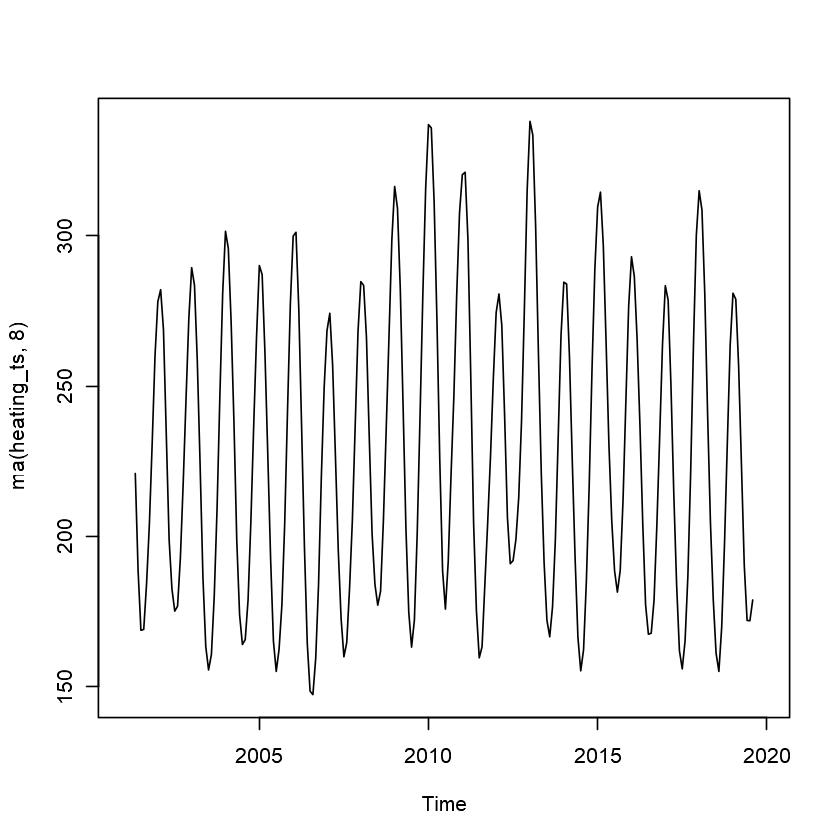

In [113]:
plot(ma(heating_ts, 8))

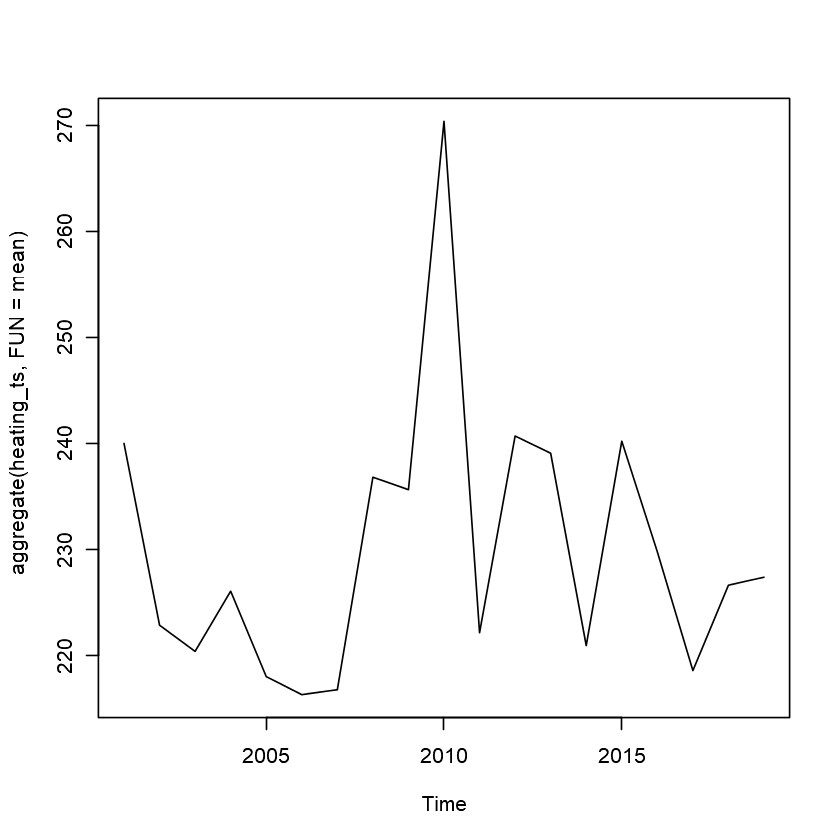

In [128]:
plot(aggregate(heating_ts, FUN = mean))   #produces the year on year trend by aggregating the cycles

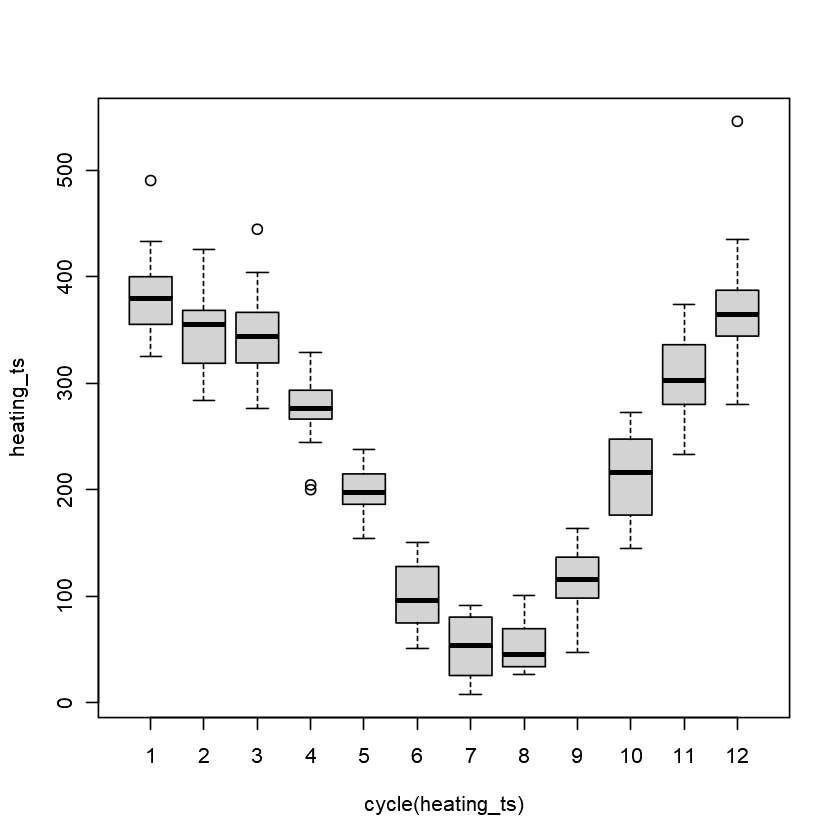

In [129]:
boxplot(heating_ts~cycle(heating_ts))

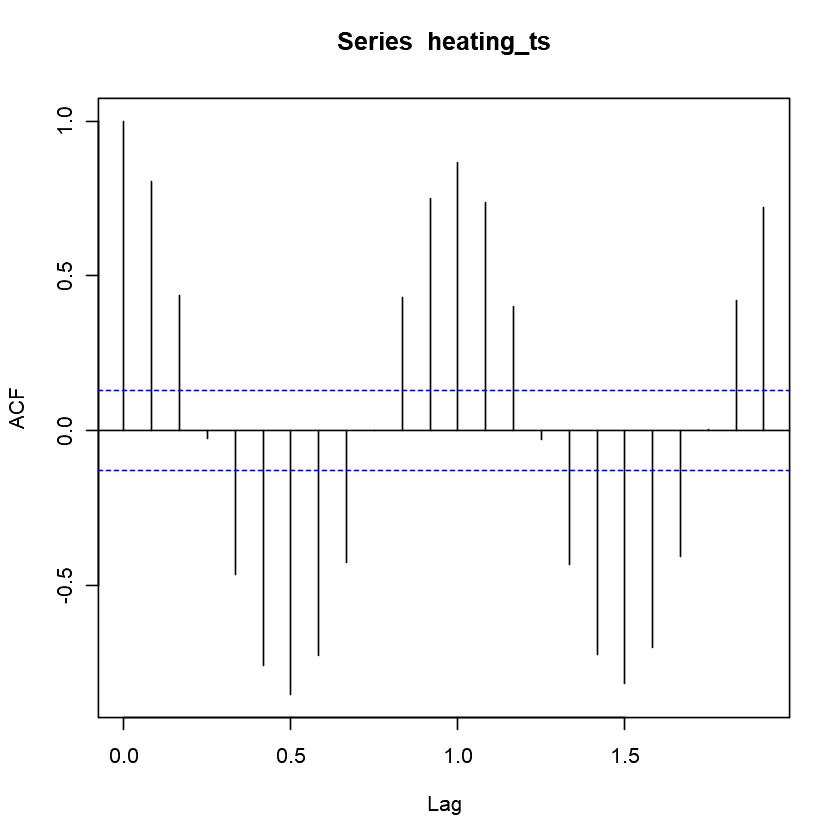

In [131]:
acf(heating_ts)

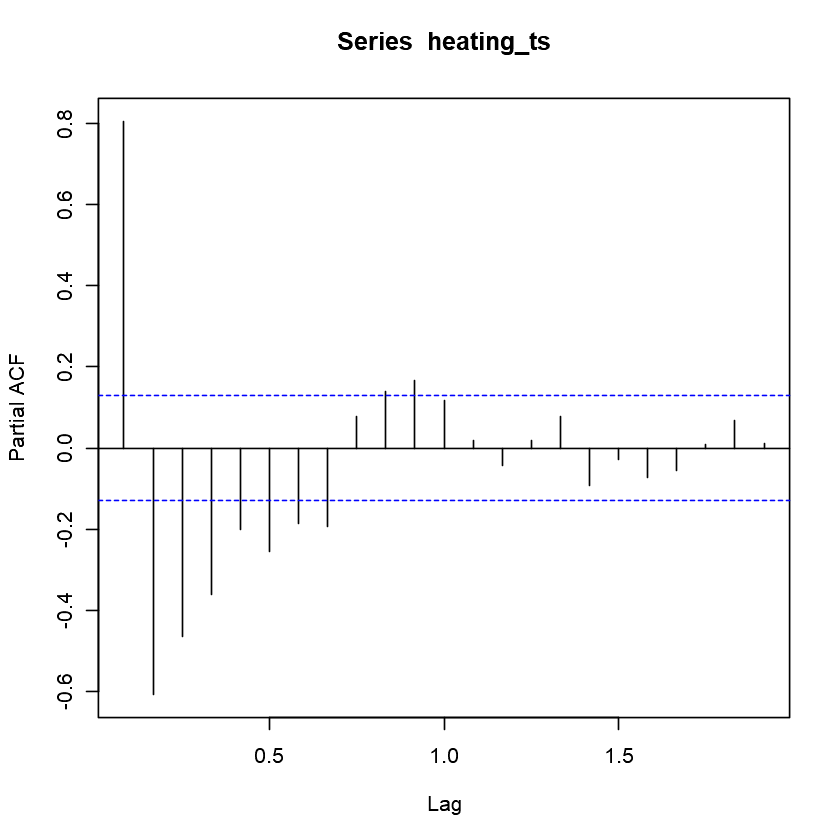

In [132]:
pacf(heating_ts)

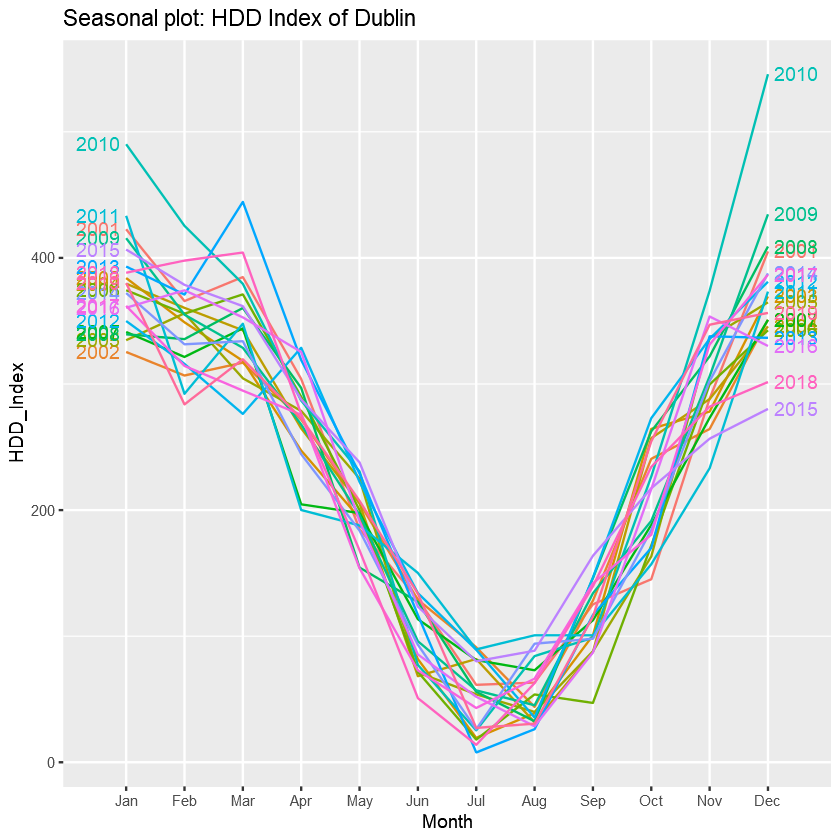

In [133]:
ggseasonplot(heating_ts, year.labels=TRUE, year.labels.left=TRUE) +
  ylab("HDD_Index") +
  ggtitle("Seasonal plot: HDD Index of Dublin")

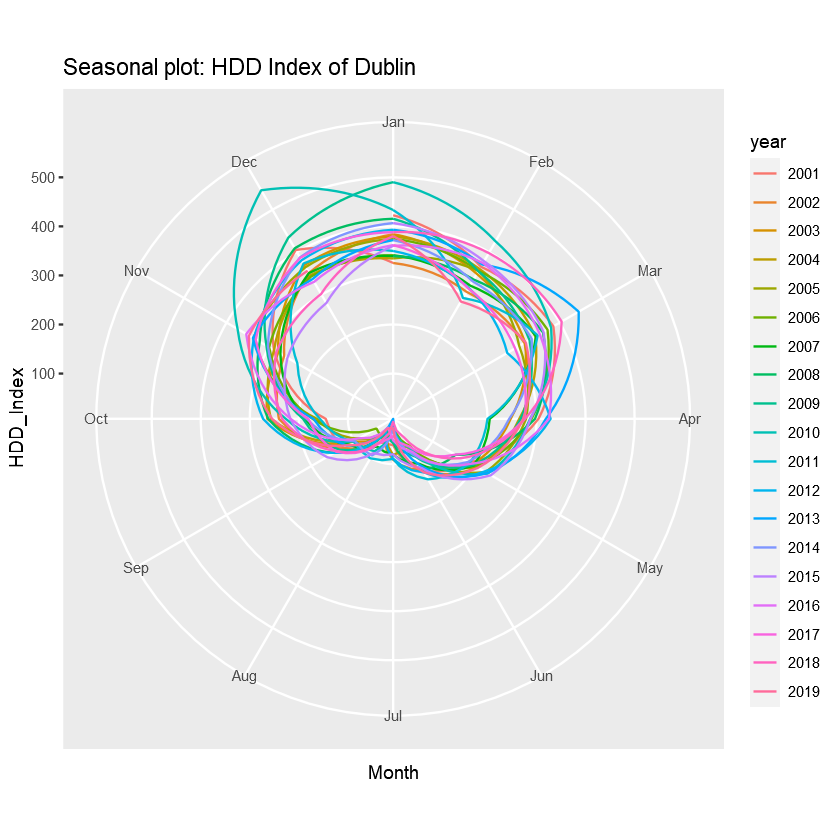

In [134]:
ggseasonplot(heating_ts, polar = TRUE) +
  ylab("HDD_Index") +
  ggtitle("Seasonal plot: HDD Index of Dublin")

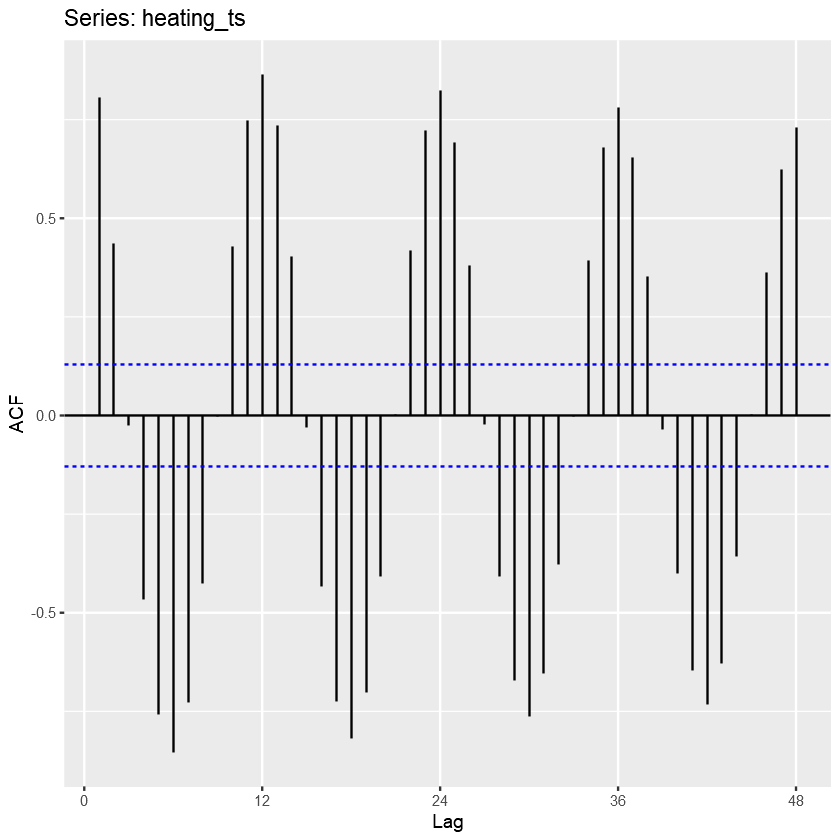

In [70]:
ggAcf(heating_ts, lag=48)


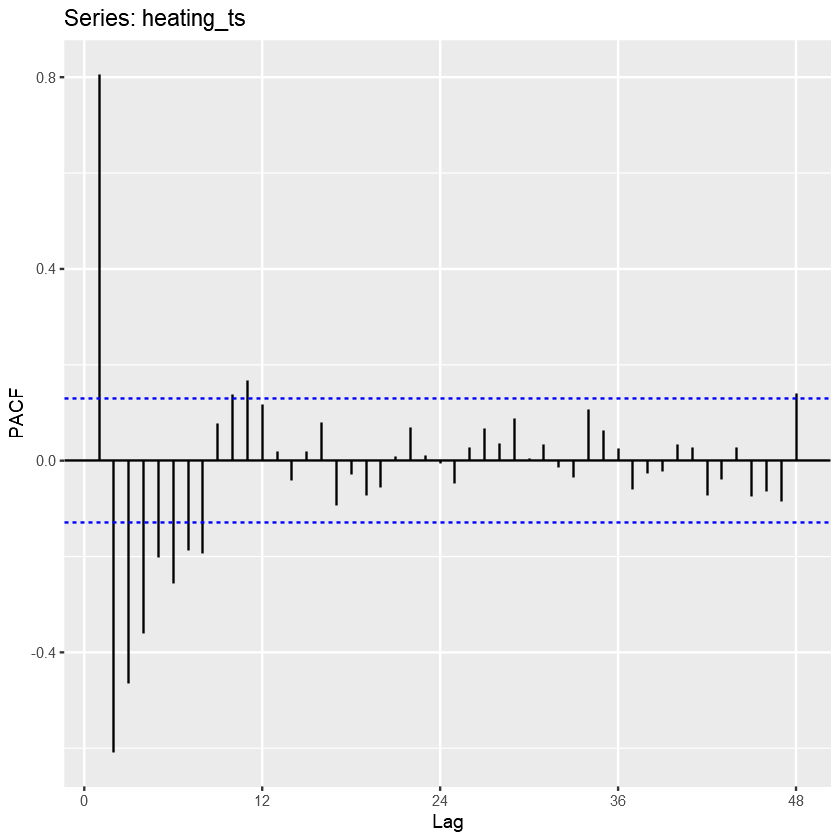

In [71]:
ggPacf(heating_ts, lag=48)


Let's try some smoothing methods now.

Warning message:
"Removed 4 row(s) containing missing values (geom_path)."


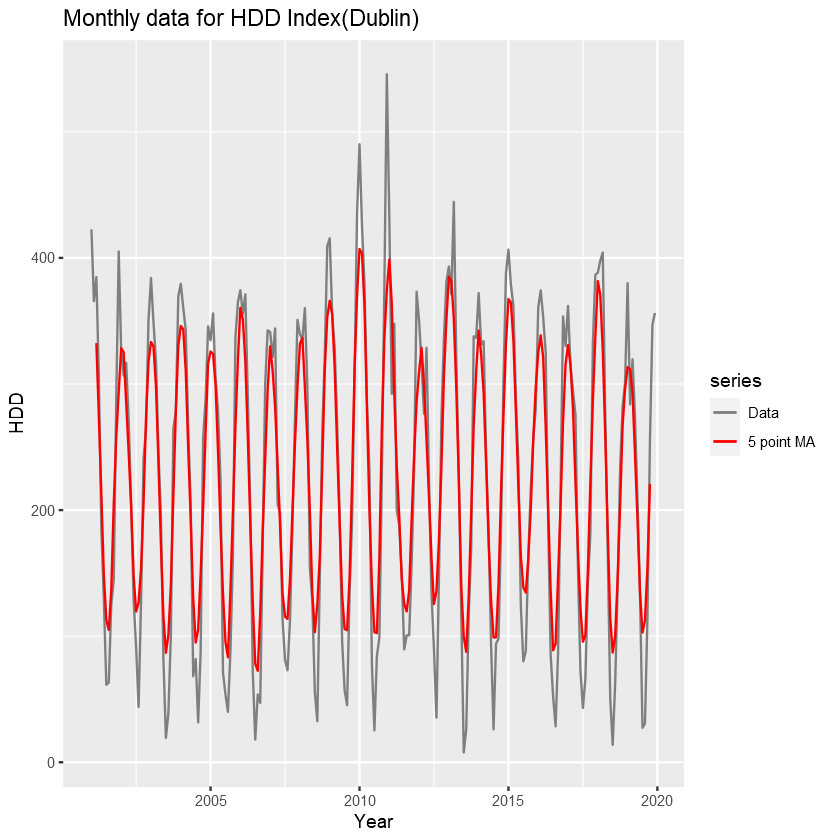

In [21]:
# Moving Average smoothing
autoplot(heating_ts, series="Data") +
  autolayer(ma(heating_ts,5), series="5 point MA") +
  xlab("Year") + ylab("HDD") +
  ggtitle("Monthly data for HDD Index(Dublin)") +
  scale_colour_manual(values=c("Data"="grey50","5 point MA"="red"),
                      breaks=c("Data","5 point MA"))

Simple Exponential smoothing: It is suitable for the data with no clear trend or seasonal pattern. But since our data has a clear seasonality, so we are not gonna try this (for now) !!

### Holt's Winters' Seasonal Method : To capture the seasonality in the data

In [50]:
train_heating = window(heating_ts, start=c(2007,1), end=c(2018,12))
test_heating = window(heating_ts, start = c(2019,1))
plotting_ts = window(heating_ts, start = c(2007,1), end = c(2019,12))

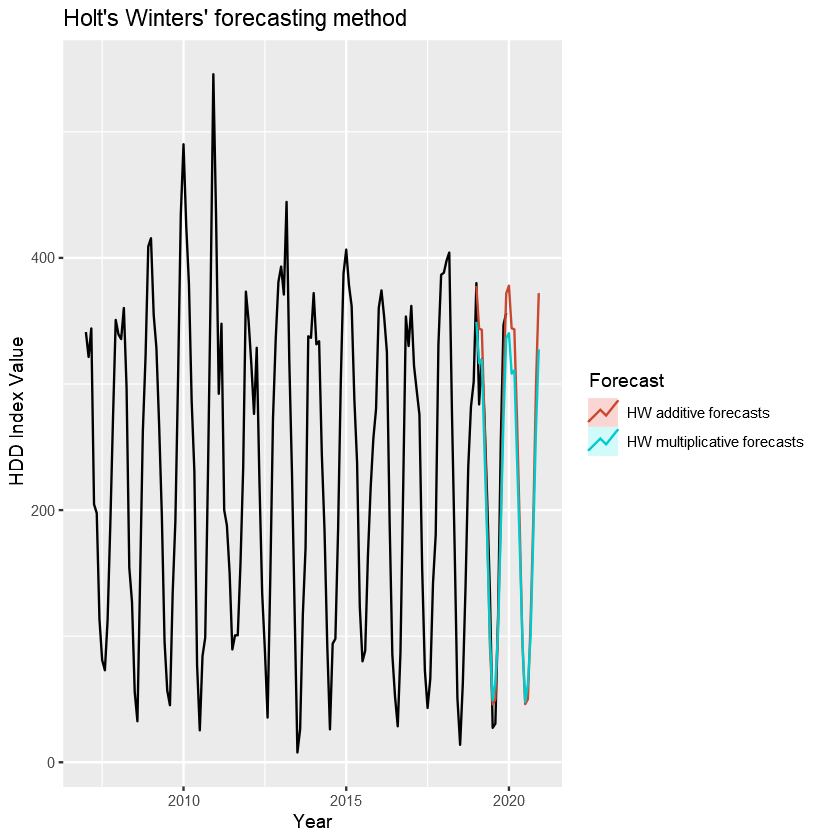

In [52]:
heat_hw <- window(heating_ts, start=2007)
fit1 <- hw(train_heating,seasonal="additive")
fit2 <- hw(train_heating,seasonal="multiplicative")
autoplot(plotting_ts) +
  autolayer(fit1, series="HW additive forecasts", PI=FALSE) +
  autolayer(fit2, series="HW multiplicative forecasts",
    PI=FALSE) +
  xlab("Year") +
  ylab("HDD Index Value") +
  ggtitle("Holt's Winters' forecasting method") +
  guides(colour=guide_legend(title="Forecast"))

In [76]:
accuracy(fit1)
accuracy(fit2)

,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,-0.08466687,38.46826,29.96959,-12.16935,26.81584,0.6537588,0.3697892


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,-0.8384935,38.31467,30.4937,-13.06674,25.61046,0.6651917,0.4072229


ERROR: Error in UseMethod("logLik"): no applicable method for 'logLik' applied to an object of class "forecast"


In [43]:
fit <- ets(heating_ts)
summary(fit)

ETS(A,N,A) 

Call:
 ets(y = heating_ts) 

  Smoothing parameters:
    alpha = 1e-04 
    gamma = 2e-04 

  Initial states:
    l = 231.0905 
    s = 141.1921 74.3094 -20.1259 -114.9659 -174.0616 -177.5248
           -129.1531 -30.8465 46.1089 115.7981 118.1471 151.1222

  sigma:  36.154

     AIC     AICc      BIC 
2889.474 2891.738 2940.914 

Training set error measures:
                    ME     RMSE      MAE       MPE     MAPE      MASE      ACF1
Training set -1.124924 35.02644 27.37349 -10.86589 23.15829 0.6798936 0.3457203


Moving average is generally used for observing the trend in the data. But we can already kind of see that in our data.

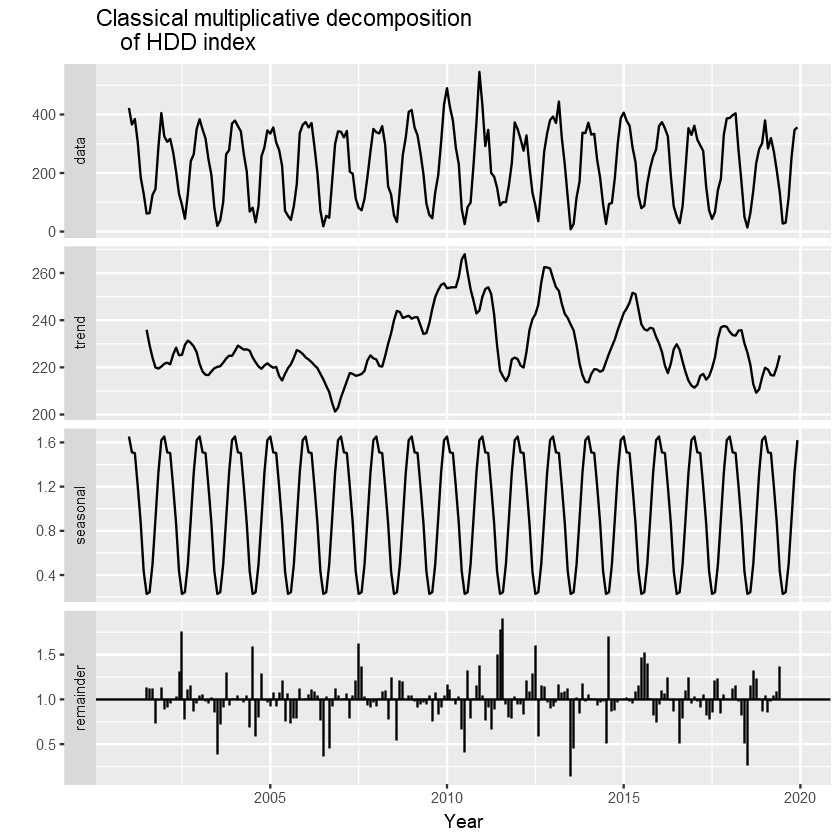

In [23]:
# Let's try the multiplicative decomposition
heating_ts %>% decompose(type="multiplicative") %>%
  autoplot() + xlab("Year") +
  ggtitle("Classical multiplicative decomposition
    of HDD index")

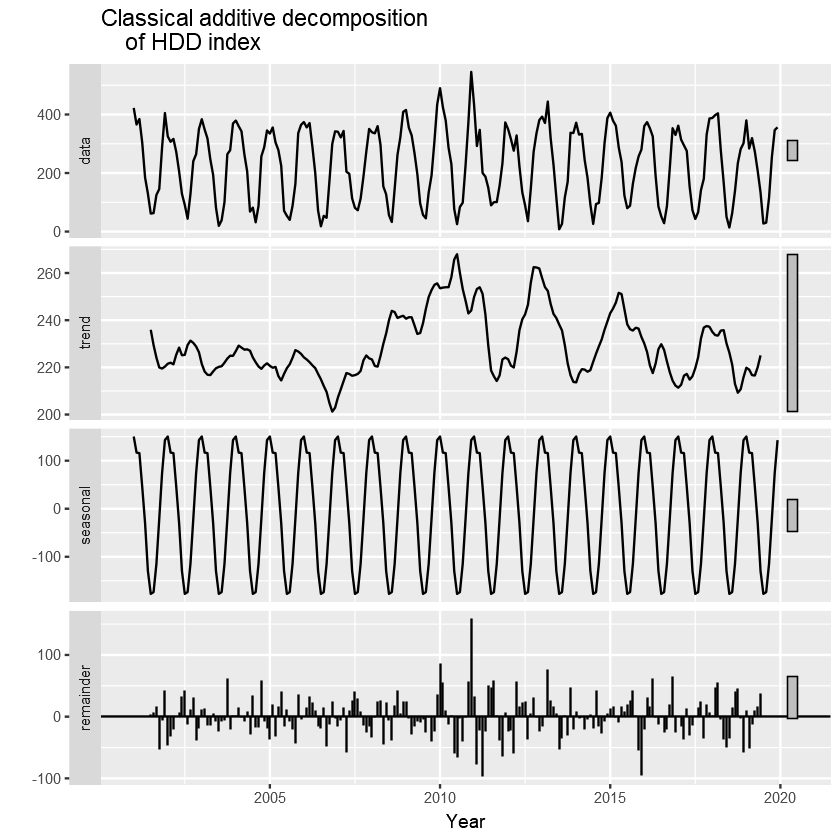

In [41]:
heating_ts %>% decompose(type="additive") %>%
  autoplot() + xlab("Year") +
  ggtitle("Classical additive decomposition
    of HDD index")

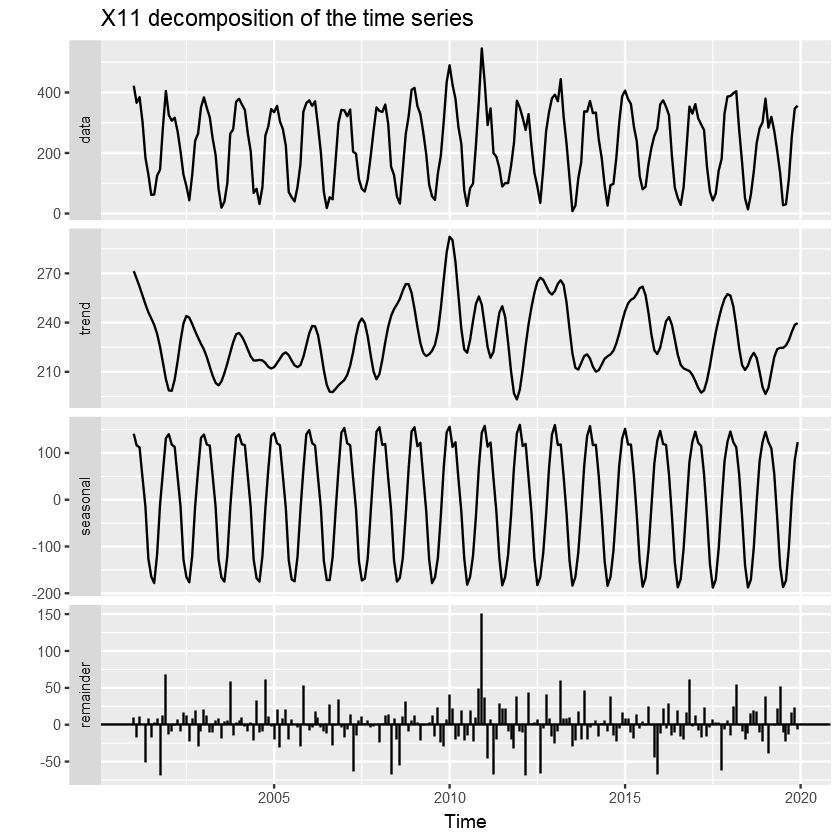

In [43]:
#X11 Decomposition
heating_ts %>% seas(x11="") -> fit
autoplot(fit) +
  ggtitle("X11 decomposition of the time series")

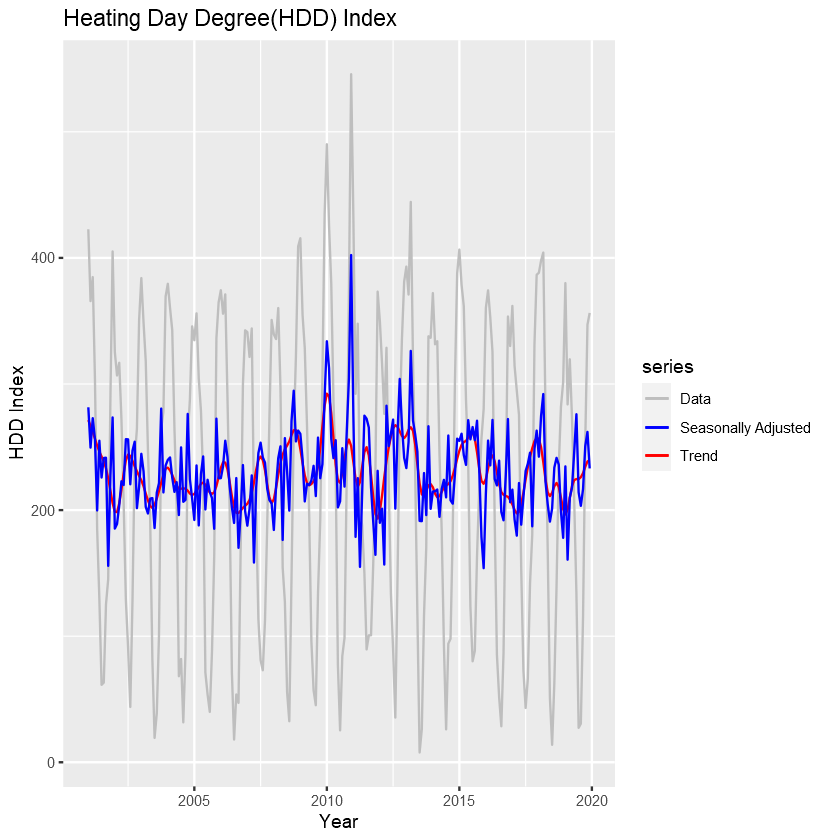

In [33]:
autoplot(heating_ts, series="Data") +
  autolayer(trendcycle(fit), series="Trend") +
  autolayer(seasadj(fit), series="Seasonally Adjusted") +
  xlab("Year") + ylab("HDD Index") +
  ggtitle("Heating Day Degree(HDD) Index") +
  scale_colour_manual(values=c("gray","blue","red"),
             breaks=c("Data","Seasonally Adjusted","Trend"))

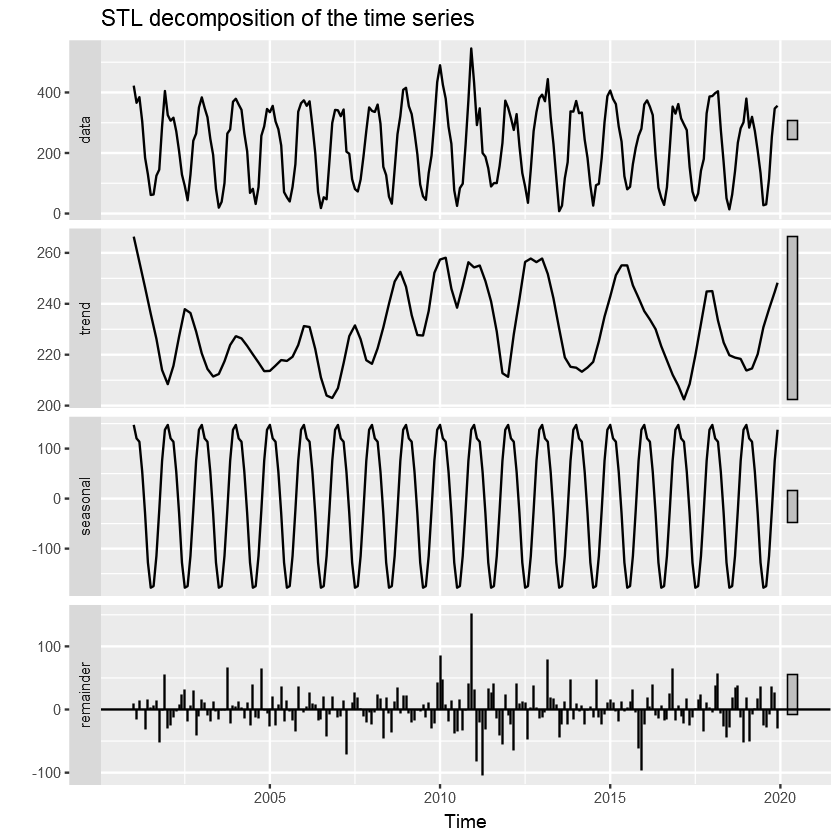

In [44]:
#STL Decomposition
heating_ts %>%
  stl(t.window=13, s.window="periodic", robust=TRUE) %>%
  autoplot() +   ggtitle("STL decomposition of the time series")

## Forecasting using decomposed time series

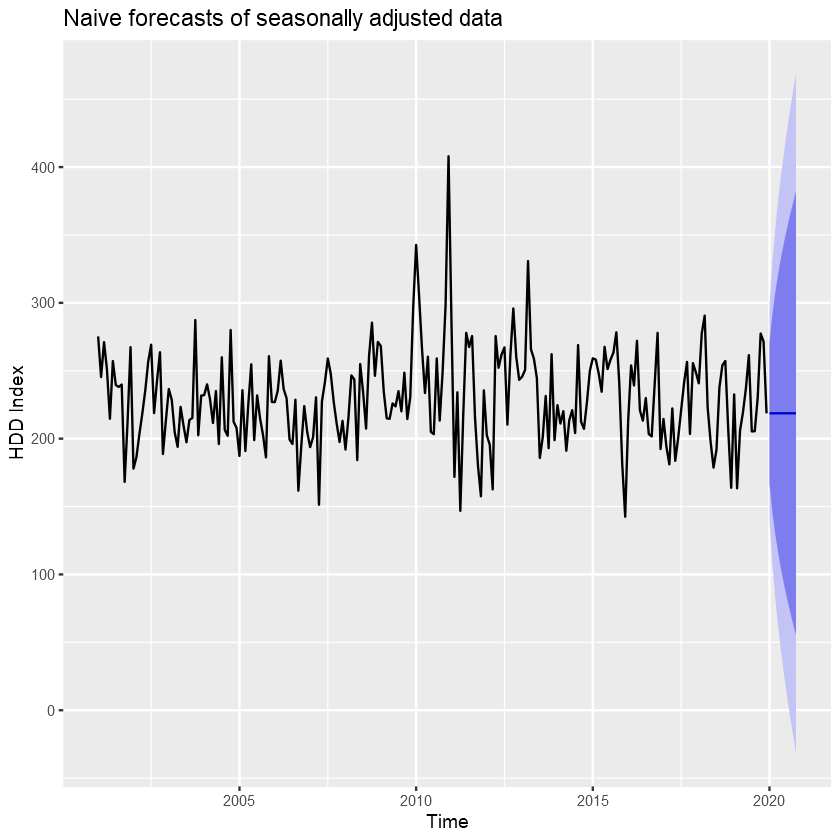

In [35]:
fit <- stl(heating_ts, t.window=13, s.window="periodic",
  robust=TRUE)
fit %>% seasadj() %>% naive() %>%
  autoplot() + ylab("HDD Index") +
  ggtitle("Naive forecasts of seasonally adjusted data")

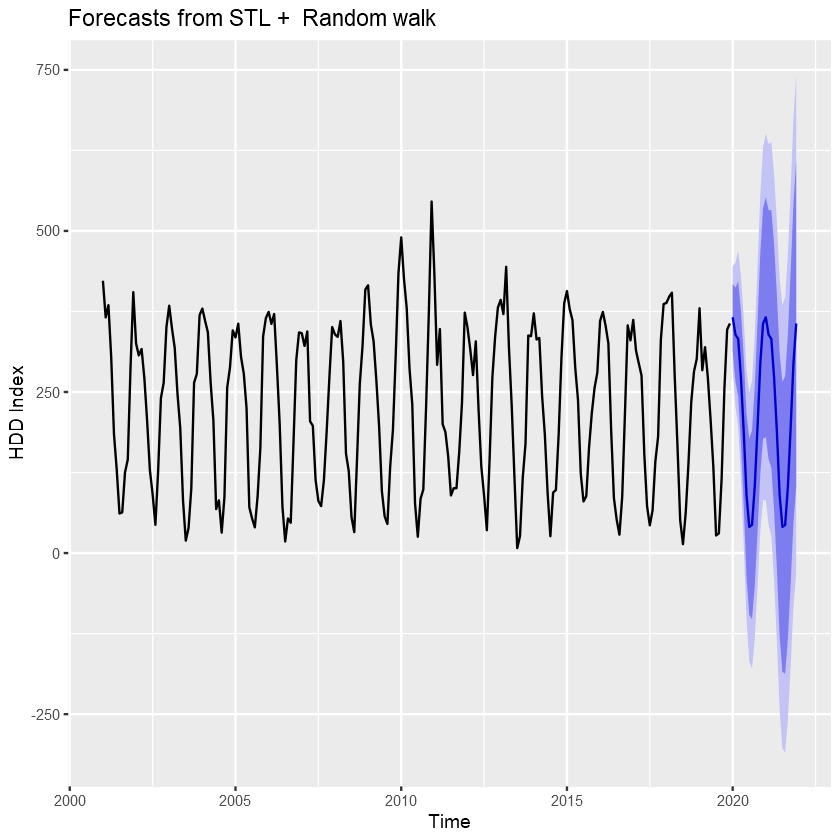

In [36]:
fit %>% forecast(method="naive") %>%
  autoplot() + ylab("HDD Index")

Soo our data shows no trend as such but shows a strong seasonality.

So now we are gonna try some seasonal models.

1. Seasonal Naive

Dividing the data into train and test using the window function

In [20]:
train_heating = window(heating_ts, start=c(2001,1), end=c(2018,12))
test_heating = window(heating_ts, start = c(2019,1))
# heating_2 <- window(heating_ts, start=2001,end=c(2018,12))
Snaive_train <- snaive(train_heating , h = 10)
Naive_train <- naive(train_heating, h = 10)
Snaive_train
Naive_train

         Point Forecast      Lo 80     Hi 80     Lo 95    Hi 95
Jan 2019         388.24 322.198542 454.28146 287.23831 489.2417
Feb 2019         397.87 331.828542 463.91146 296.86831 498.8717
Mar 2019         404.29 338.248542 470.33146 303.28831 505.2917
Apr 2019         276.36 210.318542 342.40146 175.35831 377.3617
May 2019         168.13 102.088542 234.17146  67.12831 269.1317
Jun 2019          50.88 -15.161458 116.92146 -50.12169 151.8817
Jul 2019          13.86 -52.181458  79.90146 -87.14169 114.8617
Aug 2019          62.77  -3.271458 128.81146 -38.23169 163.7717
Sep 2019         139.47  73.428542 205.51146  38.46831 240.4717
Oct 2019         234.27 168.228542 300.31146 133.26831 335.2717

         Point Forecast      Lo 80    Hi 80       Lo 95    Hi 95
Jan 2019         301.55 204.023409 399.0766  152.395951 450.7040
Feb 2019         301.55 163.626573 439.4734   90.614321 512.4857
Mar 2019         301.55 132.628990 470.4710   43.207608 559.8924
Apr 2019         301.55 106.496819 496.6032    3.241901 599.8581
May 2019         301.55  83.473914 519.6261  -31.968593 635.0686
Jun 2019         301.55  62.659616 540.4404  -63.801314 666.9013
Jul 2019         301.55  43.518895 559.5811  -93.074521 696.1745
Aug 2019         301.55  25.703145 577.3969 -120.321359 723.4214
Sep 2019         301.55   8.970228 594.1298 -145.912148 749.0121
Oct 2019         301.55  -6.856159 609.9562 -170.116518 773.2165

In [73]:
accuracy(Naive_train)
accuracy(Snaive_train)

,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,-0.5637209,76.1004,62.41833,-21.59108,51.08892,1.561551,0.4854461


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,-0.7863235,51.53242,39.97201,-12.87472,31.97836,1,0.381247


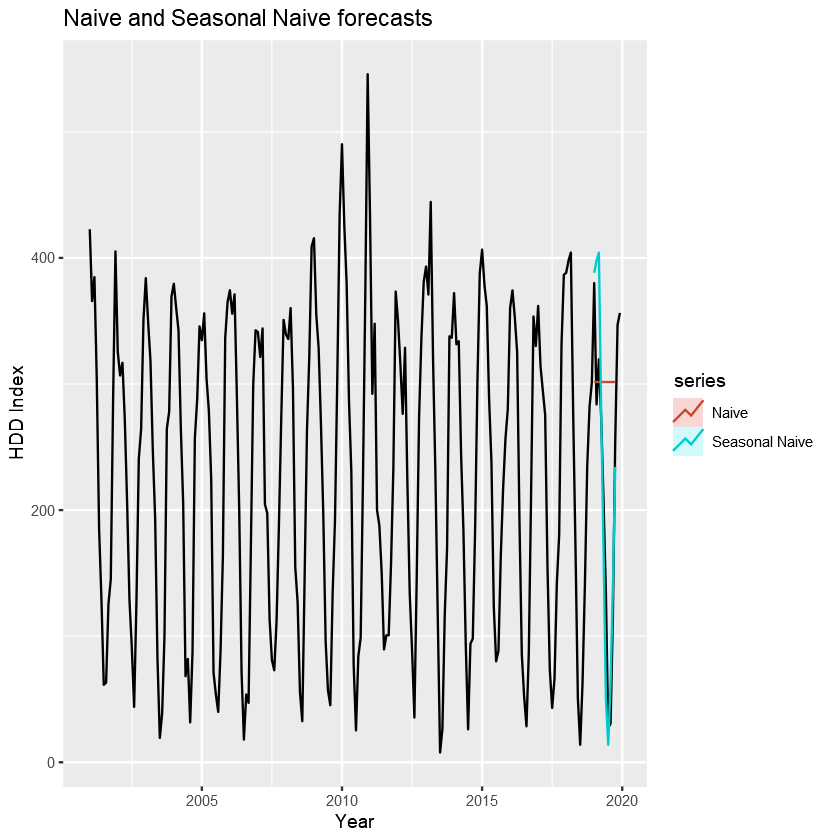

In [30]:
autoplot(heating_ts) + autolayer(Naive_train, series = "Naive", PI = FALSE)+ 
autolayer(Snaive_train, series = "Seasonal Naive", PI = FALSE) + 
xlab("Year") + ylab("HDD Index") + ggtitle("Naive and Seasonal Naive forecasts") 
    

2. ARIMA and SARIMA

In [77]:
model_arima <- auto.arima(heating_ts)
model_arima

Series: heating_ts 
ARIMA(1,0,0)(1,1,0)[12] with drift 

Coefficients:
         ar1     sar1    drift
      0.3484  -0.4590  -0.0436
s.e.  0.0643   0.0622   0.2568

sigma^2 estimated as 1823:  log likelihood=-1117.36
AIC=2242.73   AICc=2242.92   BIC=2256.23

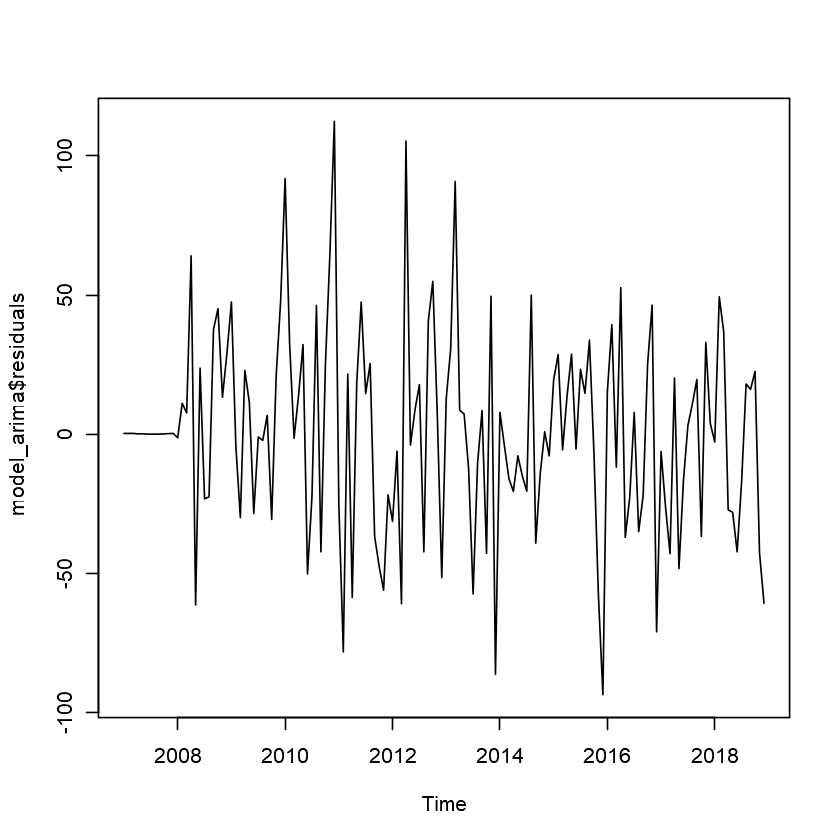

In [59]:
plot.ts(model_arima$residuals)

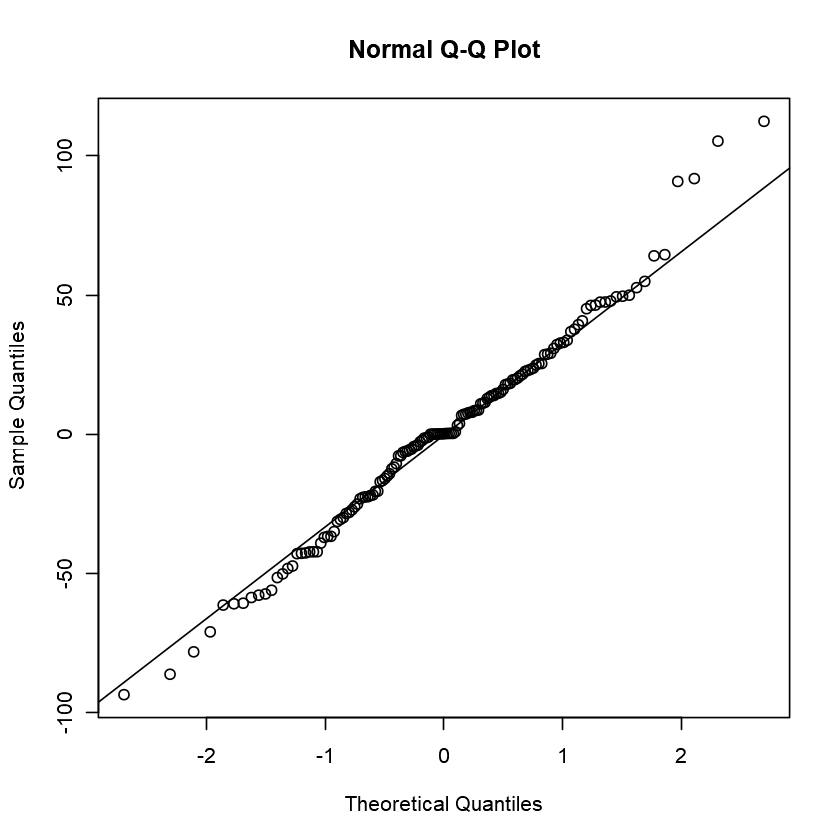

In [60]:
qqnorm(model_arima$residuals)
qqline(model_arima$residuals)




In [61]:
# model_arima2 <- auto.arima(diff(heating_ts))
Box.test(model_arima$residuals, type="Ljung-Box")


	Box-Ljung test

data:  model_arima$residuals
X-squared = 0.20658, df = 1, p-value = 0.6495



	Ljung-Box test

data:  Residuals from ARIMA(1,0,0)(1,1,0)[12] with drift
Q* = 65.201, df = 21, p-value = 2.022e-06

Model df: 3.   Total lags used: 24



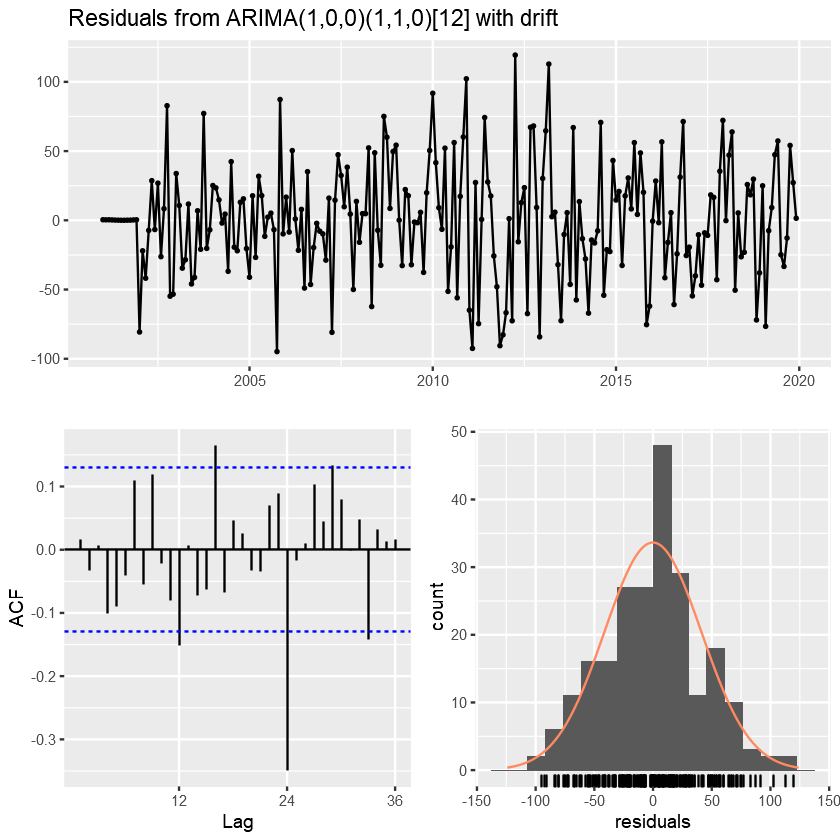

In [78]:
checkresiduals(model_arima)

In [63]:
accuracy(model_arima)

,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.4734442,36.29791,27.65096,-10.26378,22.86066,0.60318,0.03748495


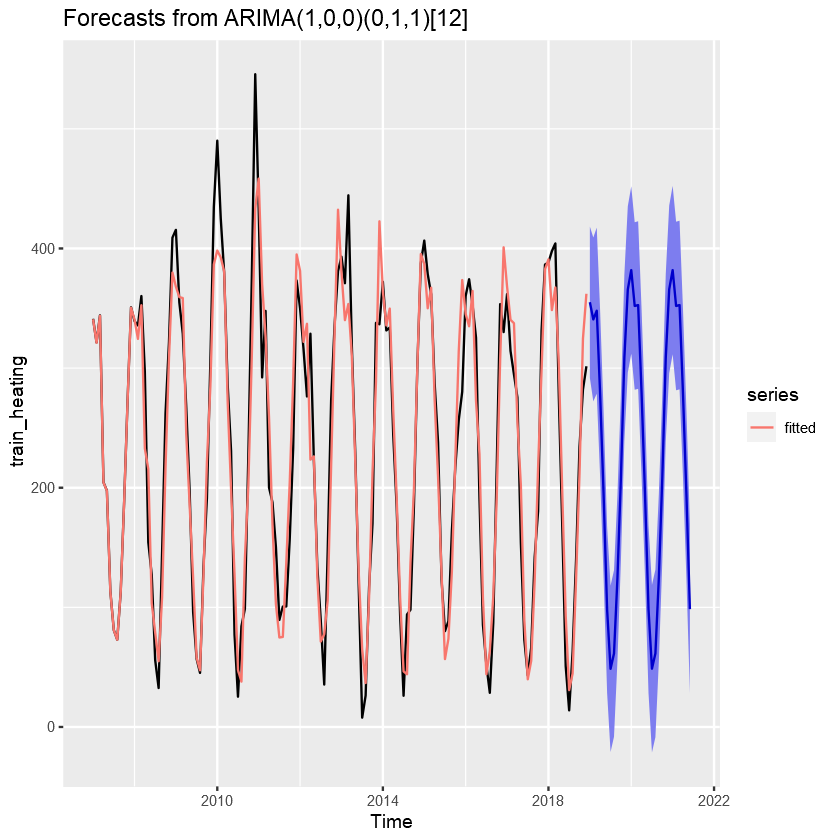

In [64]:
myforcast <- forecast(model_arima, level = c(90), h = 3*10)

autoplot(myforcast)+autolayer(fitted(myforcast), series = "fitted")

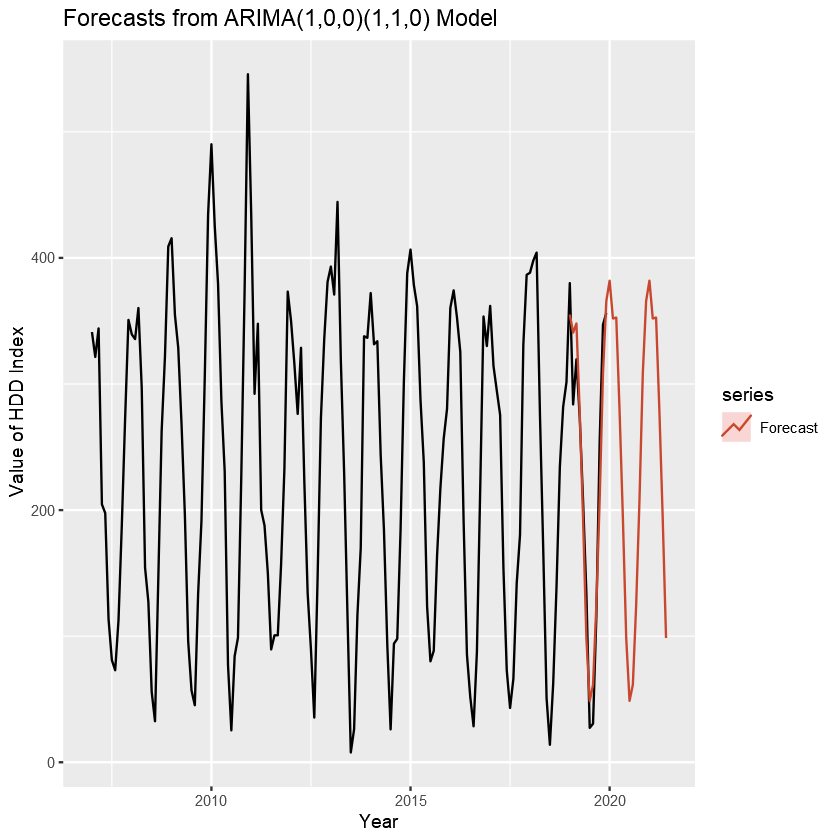

In [65]:
# plot(myforcast,
#    xlab = "Year",
#    ylab = "Value of HDD Index")
autoplot(plotting_ts) + autolayer(myforcast, series = "Forecast" ,PI = FALSE) + xlab("Year")+
ylab("Value of HDD Index") + ggtitle("Forecasts from ARIMA(1,0,0)(1,1,0) Model")

3. ETS 

In [81]:
fit.ets <- ets(train_heating)
fit.ets

ETS(A,N,A) 

Call:
 ets(y = train_heating) 

  Smoothing parameters:
    alpha = 0.053 
    gamma = 1e-04 

  Initial states:
    l = 230.3568 
    s = 145.5255 75.886 -22.5265 -116.6447 -174.4008 -176.2506
           -131.6879 -31.4166 45.1102 117.4588 119.9675 148.979

  sigma:  36.4418

     AIC     AICc      BIC 
2729.936 2732.336 2780.565 


	Ljung-Box test

data:  Residuals from ETS(A,N,A)
Q* = 48.413, df = 10, p-value = 5.217e-07

Model df: 14.   Total lags used: 24



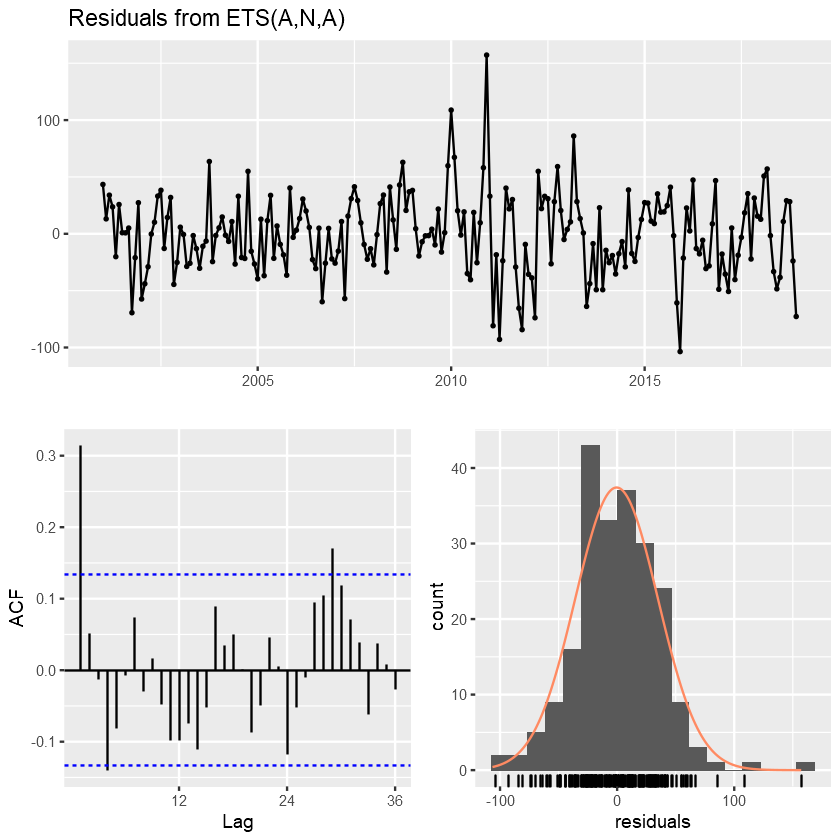

In [82]:
checkresiduals(fit.ets)

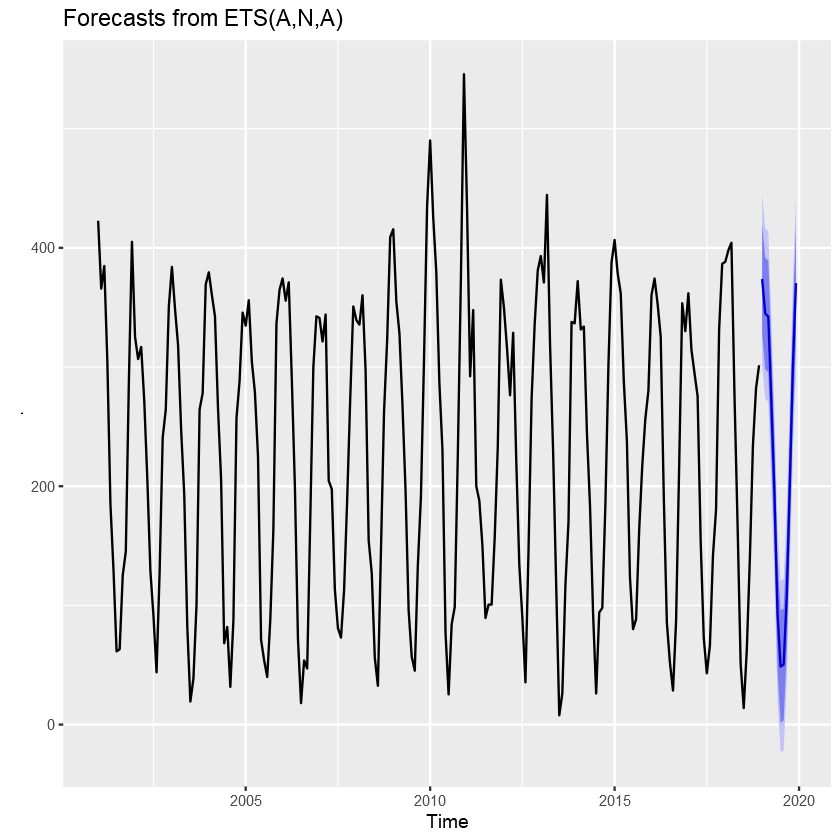

In [29]:
train_heating %>% ets() %>% forecast(h=12) %>% autoplot()

In [31]:
#Phillips perror test
pp.test(heating_ts)

Warning message in pp.test(heating_ts):
"p-value smaller than printed p-value"



	Phillips-Perron Unit Root Test

data:  heating_ts
Dickey-Fuller Z(alpha) = -80.135, Truncation lag parameter = 4, p-value
= 0.01
alternative hypothesis: stationary


In [34]:
adf.test(heating_ts, k = 1)

Warning message in adf.test(heating_ts, k = 1):
"p-value smaller than printed p-value"



	Augmented Dickey-Fuller Test

data:  heating_ts
Dickey-Fuller = -9.6038, Lag order = 1, p-value = 0.01
alternative hypothesis: stationary


In [35]:
#KPSS test
kpss.test(heating_ts)

Warning message in kpss.test(heating_ts):
"p-value greater than printed p-value"



	KPSS Test for Level Stationarity

data:  heating_ts
KPSS Level = 0.012799, Truncation lag parameter = 4, p-value = 0.1


This concludes our analysis on time series. Now get the hell outta here!